In [42]:
%run "Retropy_framework.ipynb"

## Linear Regression of returns

In [2]:
lrret(SSO, VOO, fit_values=True)  # this is the proper fit, with beta=1.74 (indicateing the inefficiency of SSO)
lrret(SSO, VOO, fit_values=False) # this is a good daily return fit, but a bad overall fit, with beta=1.99

trimmed data from 2010-09-09 [SSO, SSO - fit] to 2010-09-09 [SSO, SSO - fit]


SSO weights:
VOO   1.74
dtype: float64
trimmed data from 2010-09-09 [SSO, SSO - fit] to 2010-09-09 [SSO, SSO - fit]


SSO weights:
VOO   1.99
dtype: float64


In [3]:
lrret(VT, [VTI, VXUS], fit_values=True)  # this is the proper fit, with VTI beta as is was at the start of the period
lrret(VT, [VTI, VXUS], fit_values=False) # this is a good daily return fit, but a bad overall fit, with average VTI beta over the entire period

trimmed data from 2011-01-28 [VT, VT - fit] to 2011-01-28 [VT, VT - fit]


VT weights:
VTI    0.49
VXUS   0.51
dtype: float64
trimmed data from 2011-01-28 [VT, VT - fit] to 2011-01-28 [VT, VT - fit]


VT weights:
VTI    0.53
VXUS   0.48
dtype: float64


In [126]:
lrret(VT, [VBR, VWO])            # this won't give a perfect fit
lrret(VT, [VBR, VWO], sum1=True) # but we can force sum of weights to be 1, to fully allocate assets as best as possible

trimmed data from 2008-06-26 [VT] to 2008-06-27 [VT - fit]


VT weights:
{'VBR': 0.570517, 'VWO': 0.225256}
trimmed data from 2008-06-26 [VT] to 2008-06-27 [VT - fit]


VT weights:
{'VBR': 0.53045, 'VWO': 0.46955}


In [132]:
lrret(BND, [SPY, QQQ, VNQ]) # by default we don't allow negative weights (short position)
lrret(BND, [SPY, QQQ, VNQ], pos_weights=False) # but we can allow them to get a better fit

trimmed data from 2007-04-10 [BND] to 2007-04-11 [BND - fit]


BND weights:
{'SPY': 0.0, 'QQQ': 0.236054, 'VNQ': 0.025478}
trimmed data from 2007-04-10 [BND] to 2007-04-11 [BND - fit]


BND weights:
{'SPY': -1.015308, 'QQQ': 0.820215, 'VNQ': 0.23709}


## Incremental linear regression

VRSN   0.9659
NFLX   0.9827
EBAY   0.9906
MSFT   0.9934
CRM    0.9949
AAPL   0.9949
EXPE   0.9949
AMZN   0.9949
TWTR   0.9948
GOOG   0.9958
FB     0.9960
dtype: float64

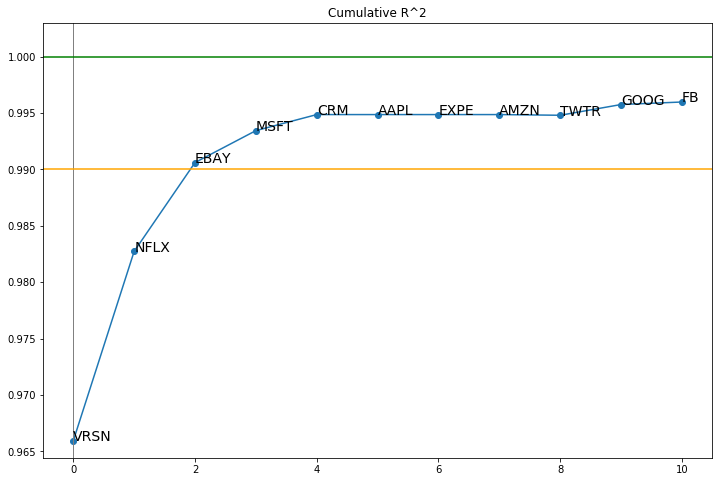

In [48]:
lrret_incremental(FDN, [FB, AMZN, GOOG, AAPL, MSFT, NFLX, CRM, EBAY, EXPE, VRSN, TWTR])

In [45]:
#rret(FDN, [FB, AMZN, GOOG, AAPL, MSFT, NFLX, CRM, EBAY, EXPE, VRSN, TWTR], return_ser=True)
lrret(FDN, [VRSN])

trimmed data from 2006-06-23 [FDN, FDN - fit] to 2006-06-23 [FDN, FDN - fit]


VRSN   0.9582
dtype: float64

VTI    0.9818
VXUS   0.9998
dtype: float64

trimmed data from 2008-06-26 [VT, VT - fit] to 2008-06-26 [VT, VT - fit]


VTI   0.6563
dtype: float64

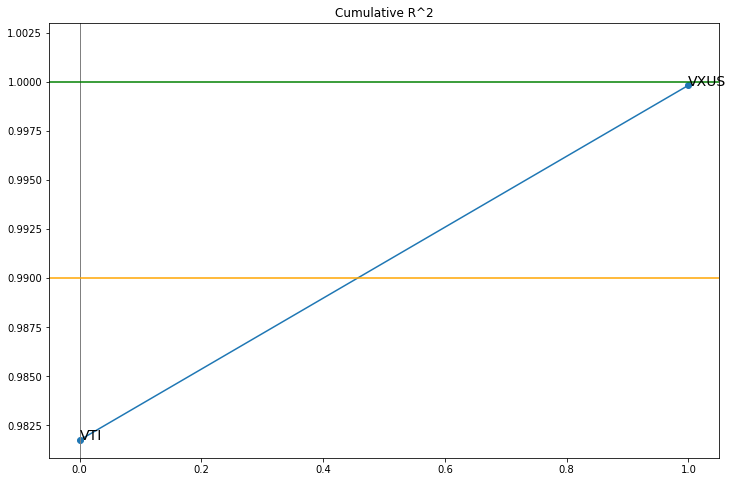

In [53]:
lrret_incremental(VT, [VTI, VXUS])
lrret(VT, [VTI])

## Rolling beta (linear regression coefficients)

In [138]:
# sanity check
show_rolling_beta(get("SPY:60|BND:40"), [SPY, BND])

In [143]:
# we expect the Permanent Portfolio ETF to be roughly 25% stocks, gold, long-bonds, cash
show_rolling_beta(PERM, [lc, gold, elgb], rsq=False, extra=[0.25])

Fetching PEDIX from AV .. DONE


In [9]:
# this reflects the US / ex-US weights of VT. We expect the sum of beta to be very close to 1.0
show_rolling_beta(VT, [VTI, VXUS], betaSum=True)

In [155]:
# we can see that SVXY has a beta of ~4-5 over SPY for it's history, until the volatility implosion
# after which the beta turned ~2 (due to the ETF objecive update)
# we can also see the p-value of the beta indicating non-significance in the window that contains the event
show_rolling_beta(SVXY, SPY, pvalue=True, window=120)

In [161]:
# here we see thet the SVXY-ZIV beta become 1.0 after the volatiltiy implosion
show_rolling_beta(SVXY, ZIV, window=120)

In [135]:
# we can play with the frequency to get different results
# by default, the window adjust to the given frequency to maintain a 1-year window
show_rolling_beta(NEAR, MINT)
show_rolling_beta(NEAR, MINT, freq="M")

trimmed data from 1993-01-29 [SPY] to 2004-09-29 [VNQ]
trimmed data from 1993-01-29 [SPY] to 2004-09-29 [VNQ]


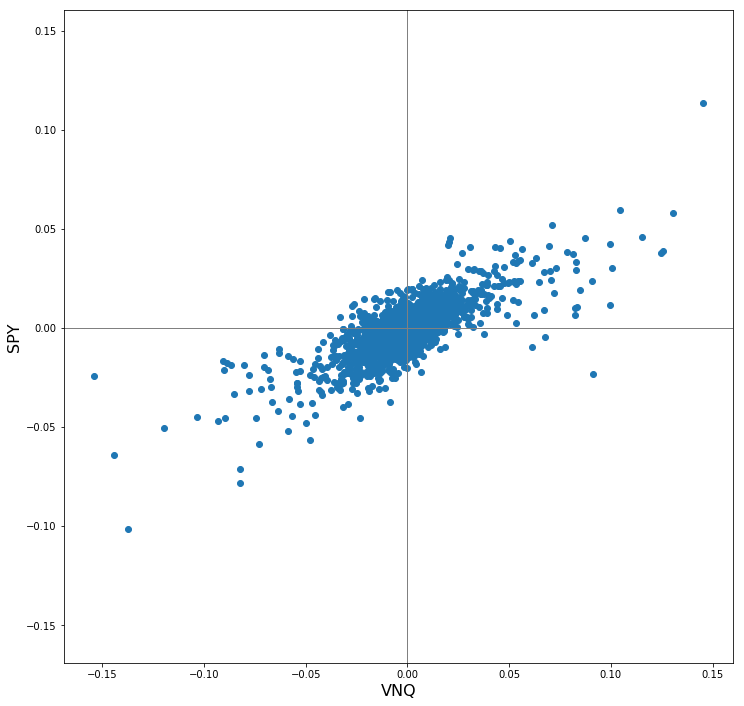

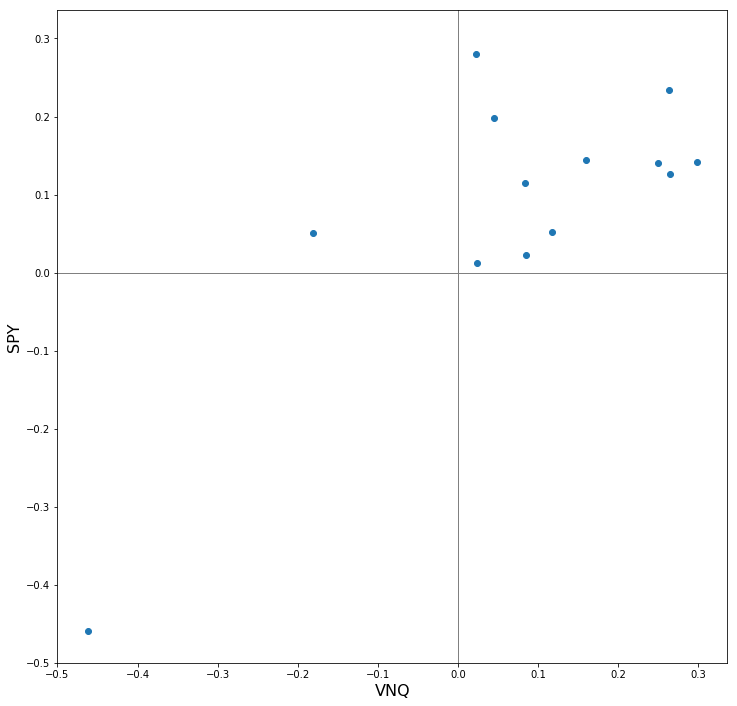

In [204]:
show_scatter_returns(SPY, VNQ)
show_scatter_returns(SPY, VNQ, freq="Y")

In [ ]:
# be sure to save before you publish
# when done, you will get a public link to an HTML file with the results
publish()